In [2]:
import matplotlib.pyplot as plt
import numpy as np

from scipy.optimize import minimize
%matplotlib inline

# Задание 1
Дана матрица рейтингов фильмов (строки - пользователи (10 человек), столбцы - фильмы (15 фильмов))

In [3]:
raitings = np.array([[ 4,  4,  9,  4,  1,  6, 10,  7,  9,  6,  9,  2,  8,  6,  6],
                     [ 9,  2,  5, 10,  7,  8, 10,  5,  6,  2,  1,  6,  8,  9,  7],
                     [ 1,  6,  8,  8,  4,  9,  3,  8, 10,  5,  2,  6,  8,  1,  6],
                     [ 6,  1,  9,  7,  7,  9,  2,  3,  5,  1,  6,  6,  3,  2,  7],
                     [ 3,  7,  3,  5,  7,  9,  9,  6,  2,  9,  1,  2,  8, 10,  6],
                     [ 8,  3,  7,  3,  8,  6,  1,  8,  8,  6,  1,  9,  4, 10,  1],
                     [ 9,  8,  4,  8,  8, 10,  6,  1,  1,  2,  9,  5,  2,  7,  2],
                     [ 4,  1,  6,  4,  3, 10,  4,  4,  2,  8,  7,  9,  3,  8,  3],
                     [ 2,  7,  7,  6, 10,  6,  8,  9,  8,  6, 10,  1,  7, 10,  4],
                     [ 5, 10,  8,  8,  9,  7,  2,  9,  9, 10,  8,  8,  8,  6, 10]])

a) Необходимо найти наиболее похожего пользователя по косинусной метрике для каждого из (ответ: 10 пар вида (x, y), где y - наиболее похожий пользователь на пользователя x).

b) Предположим, вы захотели сжать признаковые описания пользователя с 15 фильмов, до, скажем, 5-ти признаков, как вы это сделаете?

In [4]:
def cos_( a, b ):
   
   #Считаем косинусы углов между векторами a, b по их координатам
    
    
    # длины векторов
    aLength = np.linalg.norm( a )
    bLength = np.linalg.norm( b )
    
    return np.dot( a, b ) / ( aLength * bLength )

In [5]:
similar_pairs = []

for i in range(len(raitings)):
    user_raitings = raitings[i]
    cos_max = 0
    index = -1
    for j in range(len(raitings)):
        if j == i: continue
        if(cos_( user_raitings, raitings[j] ) > cos_max):
            cos_max = cos_( user_raitings, raitings[j] )
            index = j
    similar_pairs.append([i, index])
print(similar_pairs)

[[0, 8], [1, 4], [2, 9], [3, 9], [4, 8], [5, 9], [6, 3], [7, 5], [8, 0], [9, 2]]


# 1b

Используем SVD-разложение

In [6]:
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(n_components=5)
X_reduced = svd.fit_transform(raitings)
X_reduced

array([[23.41982063, -5.36092136,  3.83196779, -4.06950174,  1.10267269],
       [24.76774917,  4.52188701,  1.35815965,  1.58128545,  8.59912002],
       [22.27728589, -6.96492049, -4.84461485, -0.47661647,  3.37152266],
       [19.4257757 ,  2.64575227, -6.86014009, -4.76604765,  1.96075707],
       [22.8146354 ,  0.51464093,  7.70180188,  4.42379773,  1.29124163],
       [21.76961656,  1.94294987, -4.56934779,  8.32306487, -2.21887359],
       [21.23427453,  9.78047778,  1.16340271, -4.86074521, -2.60815471],
       [19.97476815,  4.00048677, -1.67456316,  1.1512346 , -3.5637169 ],
       [26.39306998, -3.03090482,  5.86422753, -1.67503491, -3.71500141],
       [29.94016844, -4.82012297, -3.48912415,  0.05527083, -3.62526487]])

# Задание 2

Вычислите производную tg2(sin(x) + cos(2x + 3)) в точке x0 = 1 (на python и на бумаге).

На бумаге, так на бумаге.))

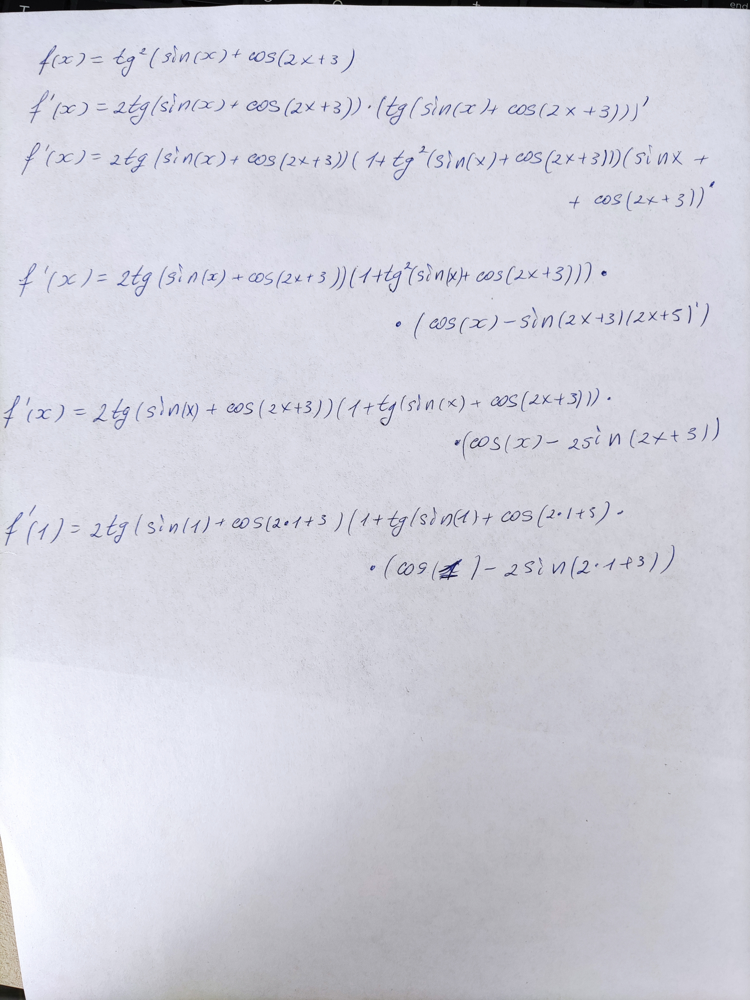


Теперь Python

In [7]:
# Найдем производные с помощью Python использую библиотеку sympy
from sympy import *
# создаем "символ" под названием x
x = Symbol('x')

# Определяем в переменную f нашу функцию
f = tan(sin(x) + cos(2*x + 3))**2

# Находим первую производную
f_derivative = f.diff(x)
f_derivative

2*(-2*sin(2*x + 3) + cos(x))*(tan(sin(x) + cos(2*x + 3))**2 + 1)*tan(sin(x) + cos(2*x + 3))

In [8]:
fd = lambdify(x, f_derivative)
print('Значение производной в точке x=1 равно ',fd(1))

Значение производной в точке x=1 равно  55.385917635337854


# Задание 3

Дана функция с неизвестными параметрами a и b, вам также известны значения функции fx в точках x. Найдите оптимальные параметры a, b, минимизирующие абсолютную ошибку error

In [9]:
def f(x, a, b):
    return np.e**a * np.sin(b*x) + x

In [10]:
x = np.array([0.        , 0.26315789, 0.52631579, 0.78947368, 1.05263158,
              1.31578947, 1.57894737, 1.84210526, 2.10526316, 2.36842105,
              2.63157895, 2.89473684, 3.15789474, 3.42105263, 3.68421053,
              3.94736842, 4.21052632, 4.47368421, 4.73684211, 5.        ])

In [11]:
fx = np.array([  0.        , -12.01819092, -18.90968634, -17.68786571,
                -8.7529108 ,   4.27524517,  16.06801336,  21.81250213,
                19.22059845,   9.48411207,  -3.22273056, -13.48576488,
               -16.91096359, -11.95866834,  -0.58630088,  12.56873816,
                22.12489421,  24.20292139,  18.04522521,   6.33211092])

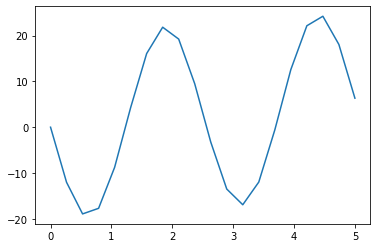

In [12]:
plt.plot(x, fx)
plt.show()

In [13]:
def error(params):
    return np.sum(np.abs(fx - f(x, params[0], params[1])))

In [14]:
params0 = [2,-2]

res_error = minimize(error, params0, method='nelder-mead', options={'xtol': 1e-6, 'disp': True})

res_error

Optimization terminated successfully.
         Current function value: 0.000106
         Iterations: 57
         Function evaluations: 108


 final_simplex: (array([[ 3.00000022, -2.50000014],
       [ 3.00000019, -2.49999984],
       [ 2.99999923, -2.50000004]]), array([0.00010576, 0.0001236 , 0.00019454]))
           fun: 0.0001057634580963196
       message: 'Optimization terminated successfully.'
          nfev: 108
           nit: 57
        status: 0
       success: True
             x: array([ 3.00000022, -2.50000014])

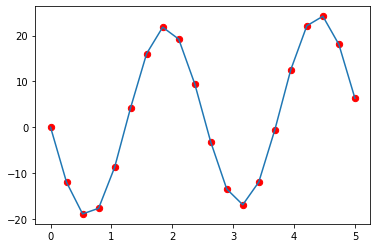

In [15]:
#plt.plot(x, fx)
plt.scatter(x, fx, color='red', s=40, marker='o')
plt.plot(x, f(x, 3, -2.5))
plt.show()


# Задание 4
Создайте собственную дискретную случайную величину с 20 значениями. Сгенерируйте 1000 выборок размера 50. Посчитайте среднее для каждой выборки. Постройте гистограмму распределения средних.

In [18]:
# С помощью функции numpy.random.randint зададим случайную величину с 20 значениями:
vars_  = np.random.randint(100, size=20)
vars_

array([72,  4, 96, 42, 84, 76, 27, 97,  5, 79, 70, 21, 91, 40, 48, 48, 11,
       32, 77, 45])

In [19]:
# С помощью функции numpy.random.choice будем из нашей случайной величины M генерировать выборки размера 50.
# Сделаем таких выборок 1000, для каждой из них с помощью функции numpy.mean вычислим среднее арифметическое, а из
# полученных средних арифметических создадим набор данных (список) mean
mean = []
for i in range(1000):
    selection = np.random.choice(vars_, size=50)
    mean.append(np.mean(selection))
len(mean)

1000

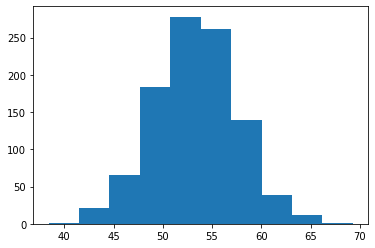

In [20]:
# Построим гистограмму распределения средних
plt.hist(mean)
plt.show()

# Задание 5
Найдите собственные значения и собственные вектора матрицы (на python и на бумаге)

[[1, 4],

[1, 1]]

Python:

In [21]:
a = np.array([[1, 4],
              [1, 1]])
print(a)

[[1 4]
 [1 1]]


In [22]:
w, v = np.linalg.eig((a))
for i in range(len(w)):
    print("Собственное значение " + str(w[i]))
    print("соответствующий ему собственный вектор " + str(v[:,i]))

Собственное значение 3.0000000000000004
соответствующий ему собственный вектор [0.89442719 0.4472136 ]
Собственное значение -0.9999999999999996
соответствующий ему собственный вектор [-0.89442719  0.4472136 ]


И снова бумага

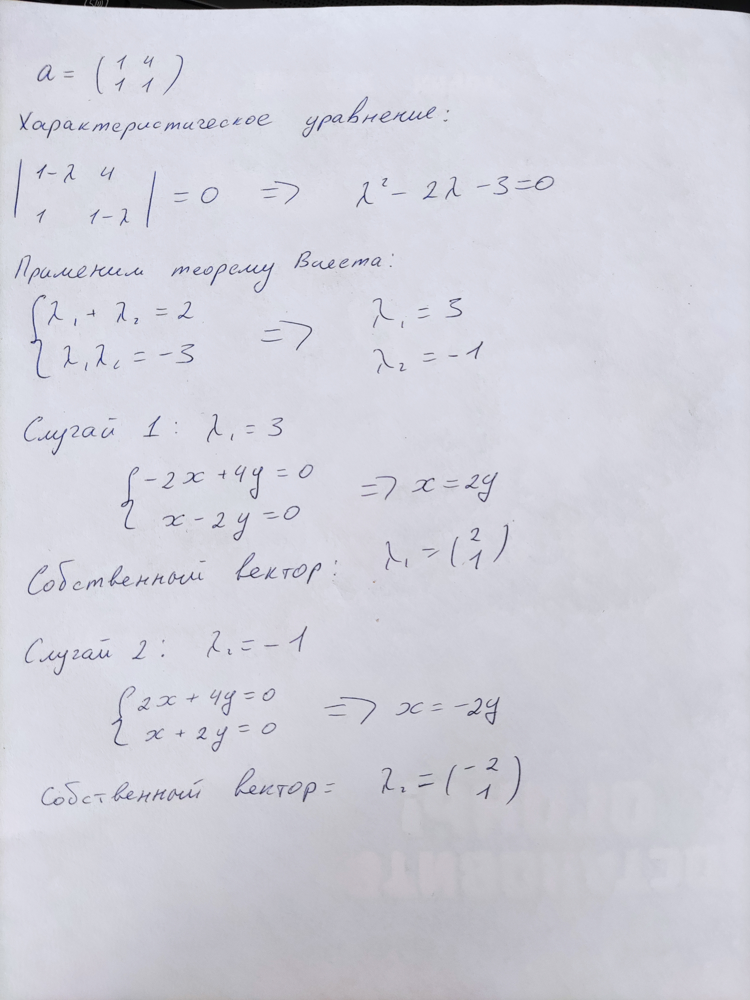